In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 8
matplotlib.rcParams['figure.figsize'] = (6, 4)
matplotlib.rcParams['figure.facecolor'] = '#ffffff'

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
df=pd.read_csv(r'data.csv')

In [6]:
Breast_cancer_df=df.copy()

In [7]:
Breast_cancer_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [8]:
Breast_cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [9]:
Breast_cancer_df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [10]:
Breast_cancer_df.drop('Unnamed: 32',axis=1,inplace=True)

In [11]:
Breast_cancer_df['diagnosis'].value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

In [12]:
from sklearn.preprocessing import LabelEncoder
labelenc=LabelEncoder()
Breast_cancer_df['diagnosis']=labelenc.fit_transform(Breast_cancer_df['diagnosis'])

In [13]:
Breast_cancer_df['diagnosis'].value_counts()#0 is Benign and 1 is Malignant

diagnosis
0    357
1    212
Name: count, dtype: int64

In [14]:
Breast_c_corr=Breast_cancer_df.corr()
Breast_c_corr

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.039769,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,...,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
diagnosis,0.039769,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.074626,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.044158,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661


In [15]:
Breast_cancer_df.describe()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [16]:
Breast_c_corr['diagnosis']

id                         0.039769
diagnosis                  1.000000
radius_mean                0.730029
texture_mean               0.415185
perimeter_mean             0.742636
area_mean                  0.708984
smoothness_mean            0.358560
compactness_mean           0.596534
concavity_mean             0.696360
concave points_mean        0.776614
symmetry_mean              0.330499
fractal_dimension_mean    -0.012838
radius_se                  0.567134
texture_se                -0.008303
perimeter_se               0.556141
area_se                    0.548236
smoothness_se             -0.067016
compactness_se             0.292999
concavity_se               0.253730
concave points_se          0.408042
symmetry_se               -0.006522
fractal_dimension_se       0.077972
radius_worst               0.776454
texture_worst              0.456903
perimeter_worst            0.782914
area_worst                 0.733825
smoothness_worst           0.421465
compactness_worst          0

In [20]:
sns.pairplot(Breast_cancer_df)

In [17]:
B_c_d=Breast_c_corr['diagnosis'].values
B_c_d_i=Breast_c_corr['diagnosis'].index

In [18]:
print(Breast_c_corr['diagnosis'])
print(B_c_d)
print(B_c_d_i)

id                         0.039769
diagnosis                  1.000000
radius_mean                0.730029
texture_mean               0.415185
perimeter_mean             0.742636
area_mean                  0.708984
smoothness_mean            0.358560
compactness_mean           0.596534
concavity_mean             0.696360
concave points_mean        0.776614
symmetry_mean              0.330499
fractal_dimension_mean    -0.012838
radius_se                  0.567134
texture_se                -0.008303
perimeter_se               0.556141
area_se                    0.548236
smoothness_se             -0.067016
compactness_se             0.292999
concavity_se               0.253730
concave points_se          0.408042
symmetry_se               -0.006522
fractal_dimension_se       0.077972
radius_worst               0.776454
texture_worst              0.456903
perimeter_worst            0.782914
area_worst                 0.733825
smoothness_worst           0.421465
compactness_worst          0

In [19]:
B_feature_dict={}

In [20]:
for i,j in zip(B_c_d_i,B_c_d):
    B_feature_dict[i]=j
    


In [21]:
B_feature_dict

{'id': 0.03976850962171701,
 'diagnosis': 1.0,
 'radius_mean': 0.7300285113754563,
 'texture_mean': 0.41518529984520475,
 'perimeter_mean': 0.7426355297258334,
 'area_mean': 0.7089838365853902,
 'smoothness_mean': 0.35855996508593324,
 'compactness_mean': 0.5965336775082527,
 'concavity_mean': 0.6963597071719052,
 'concave points_mean': 0.7766138400204371,
 'symmetry_mean': 0.33049855426254676,
 'fractal_dimension_mean': -0.012837602698431882,
 'radius_se': 0.5671338208247175,
 'texture_se': -0.008303332973877035,
 'perimeter_se': 0.5561407034314831,
 'area_se': 0.5482359402780241,
 'smoothness_se': -0.0670160105794875,
 'compactness_se': 0.2929992442488586,
 'concavity_se': 0.2537297659808307,
 'concave points_se': 0.4080423327165051,
 'symmetry_se': -0.006521755870647806,
 'fractal_dimension_se': 0.07797241739025584,
 'radius_worst': 0.7764537785950396,
 'texture_worst': 0.4569028213967985,
 'perimeter_worst': 0.7829141371737594,
 'area_worst': 0.7338250349210504,
 'smoothness_worst'

In [22]:
feature_sel=list(filter(lambda x:x>0.2 or x<-0.2,B_c_d))
print(feature_sel)

[1.0, 0.7300285113754563, 0.41518529984520475, 0.7426355297258334, 0.7089838365853902, 0.35855996508593324, 0.5965336775082527, 0.6963597071719052, 0.7766138400204371, 0.33049855426254676, 0.5671338208247175, 0.5561407034314831, 0.5482359402780241, 0.2929992442488586, 0.2537297659808307, 0.4080423327165051, 0.7764537785950396, 0.4569028213967985, 0.7829141371737594, 0.7338250349210504, 0.4214648610664026, 0.5909982378417918, 0.6596102103692332, 0.7935660171412694, 0.4162943110486197, 0.32387218872082474]


In [23]:
final_features=[]
for index,value in B_feature_dict.items():
    for i in feature_sel:
        if value==i:
            final_features.append(index)
print(final_features)

['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'radius_se', 'perimeter_se', 'area_se', 'compactness_se', 'concavity_se', 'concave points_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [24]:
print(len(final_features),len(Breast_cancer_df.columns))

26 32


In [25]:
Breast_cancer_df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

<Axes: xlabel='diagnosis', ylabel='count'>

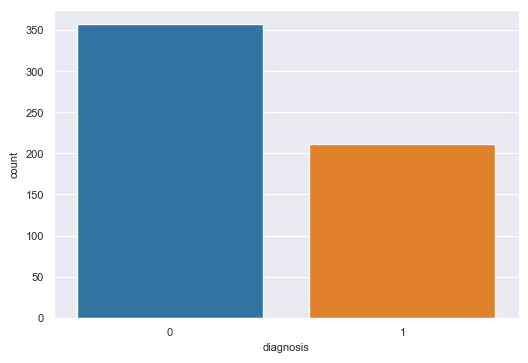

In [26]:
sns.countplot(x='diagnosis',data=Breast_cancer_df)

In [42]:
Breast_cancer_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


<Axes: xlabel='radius_mean', ylabel='Density'>

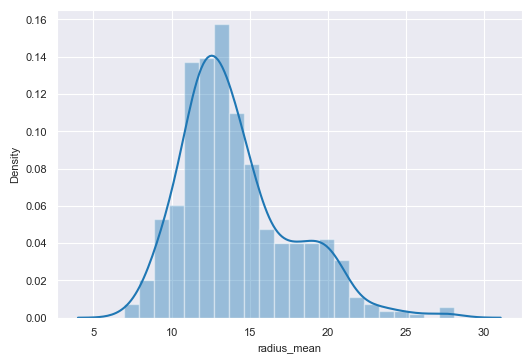

In [47]:
sns.distplot(Breast_cancer_df['radius_mean'])

<Axes: xlabel='perimeter_mean', ylabel='Density'>

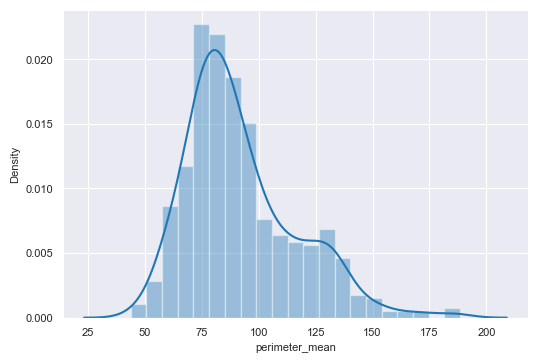

In [48]:
sns.distplot(Breast_cancer_df['perimeter_mean'])

<Axes: xlabel='area_mean', ylabel='Density'>

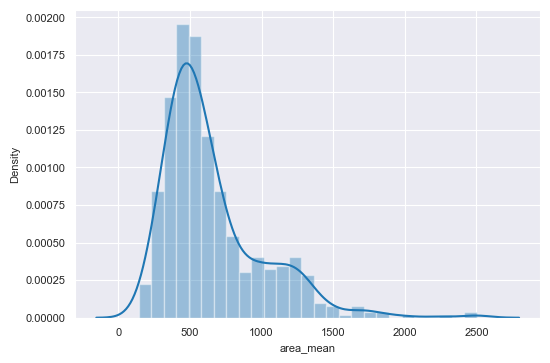

In [49]:
sns.distplot(Breast_cancer_df['area_mean'])

<Axes: xlabel='texture_mean', ylabel='Density'>

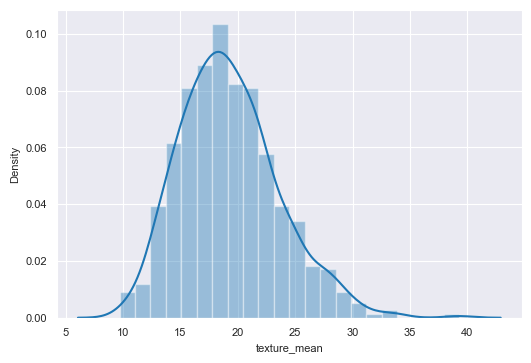

In [50]:
sns.distplot(Breast_cancer_df['texture_mean'])

## Models

In [27]:
X=Breast_cancer_df[final_features]
X.drop('diagnosis',axis=1,inplace=True)

In [28]:
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,radius_se,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,1.0950,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.5435,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.7456,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.4956,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.7572,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,1.1760,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.7655,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.4564,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.7260,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [29]:
y=Breast_cancer_df['diagnosis']

In [30]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay,confusion_matrix,classification_report,fbeta_score
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

### Model--1 Logistic Reg

In [41]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
pipeline=Pipeline([('scaler',StandardScaler()),('classifier',LogisticRegression())])
param_grid={'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
           'classifier__penalty': ['l1', 'l2'],
           'classifier__solver': ['lbfgs', 'liblinear', 'saga']}
grid_search=GridSearchCV(pipeline,param_grid,cv=5)
grid_search.fit(X_train,y_train)
best_model=grid_search.best_estimator_
y_pred=best_model.predict(X_test)


# Print classification report and confusion matrix
print(classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cnf_matrix)

# Print the best hyperparameters found by GridSearchCV
print("Best Hyperparameters:")
print(grid_search.best_params_)
# Calculate F1-beta score
for i in (0.5,1,2):
    #beta = 0.5  # Example value for beta (you can adjust as needed)
    f1_beta_score = fbeta_score(y_test, y_pred, beta=i, average='weighted')
    # Print the F1-beta score
    print(f"F1-beta ({i}) Score:", f1_beta_score)

              precision    recall  f1-score   support

           0       0.99      0.97      0.98        71
           1       0.95      0.98      0.97        43

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

Confusion Matrix:
[[69  2]
 [ 1 42]]
Best Hyperparameters:
{'classifier__C': 1, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
F1-beta (0.5) Score: 0.9738526447250312
F1-beta (1) Score: 0.973742132293316
F1-beta (2) Score: 0.9736883404367793


### Logistic regression applied to the whole df

In [33]:
X1=Breast_cancer_df.copy()

In [34]:
X1.drop('id',axis=1,inplace=True)

In [35]:
y1=y


In [36]:
X1.drop('diagnosis',axis=1,inplace=True)

In [37]:
X_train,X_test,y_train,y_test=train_test_split(X1,y1,test_size=0.2,random_state=42)
pipeline=Pipeline([('scaler',StandardScaler()),('classifier',LogisticRegression())])
param_grid={'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
           'classifier__penalty': ['l1', 'l2'],
           'classifier__solver': ['lbfgs', 'liblinear', 'saga']}
grid_search=GridSearchCV(pipeline,param_grid,cv=5)
grid_search.fit(X_train,y_train)
best_model=grid_search.best_estimator_
y_pred=best_model.predict(X_test)
# Print classification report and confusion matrix
print(classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cnf_matrix)

# Print the best hyperparameters found by GridSearchCV
print("Best Hyperparameters:")
print(grid_search.best_params_)


# Define the new patient data with 30 features
new_patient_values = np.array([13.5, 20.0, 85.0, 550.0, 0.1, 0.1, 0.08, 0.04, 0.2,
                               0.07, 0.5, 1.5, 4.0, 40.0, 0.007, 0.02, 0.03, 0.01, 0.02,
                               0.004, 15.0, 25.0, 100.0, 700.0, 0.15, 0.25, 0.3, 0.1, 0.3, 0.09])

# Reshape the array to match the shape expected by the model (1 sample, 30 features)
new_patient_data = new_patient_values.reshape(1, -1)

# Apply the same preprocessing steps as the training data
scaler = StandardScaler()  # Assuming StandardScaler was used in the pipeline
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform on training data
new_patient_data_scaled = scaler.transform(new_patient_data)  # Transform new patient data

# Now you can use the trained model to predict on the scaled new patient data
pred_patient = best_model.predict(new_patient_data_scaled)
if pred_patient==0:
    print("It is Benign")
else:
    print("it is malignant")


              precision    recall  f1-score   support

           0       0.99      1.00      0.99        71
           1       1.00      0.98      0.99        43

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

Confusion Matrix:
[[71  0]
 [ 1 42]]
Best Hyperparameters:
{'classifier__C': 0.1, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear'}
It is Benign


In [36]:
X1.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Oh wow...so I have a 99% accuracy now when I included those columns I dropped earlier.

In [37]:
X_test

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
204,12.47,18.60,81.09,481.9,0.09965,0.10580,0.08005,0.03821,0.1925,0.06373,...,14.97,24.64,96.05,677.9,0.1426,0.2378,0.2671,0.10150,0.3014,0.08750
70,18.94,21.31,123.60,1130.0,0.09009,0.10290,0.10800,0.07951,0.1582,0.05461,...,24.86,26.58,165.90,1866.0,0.1193,0.2336,0.2687,0.17890,0.2551,0.06589
131,15.46,19.48,101.70,748.9,0.10920,0.12230,0.14660,0.08087,0.1931,0.05796,...,19.26,26.00,124.90,1156.0,0.1546,0.2394,0.3791,0.15140,0.2837,0.08019
431,12.40,17.68,81.47,467.8,0.10540,0.13160,0.07741,0.02799,0.1811,0.07102,...,12.88,22.91,89.61,515.8,0.1450,0.2629,0.2403,0.07370,0.2556,0.09359
540,11.54,14.44,74.65,402.9,0.09984,0.11200,0.06737,0.02594,0.1818,0.06782,...,12.26,19.68,78.78,457.8,0.1345,0.2118,0.1797,0.06918,0.2329,0.08134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,14.64,16.85,94.21,666.0,0.08641,0.06698,0.05192,0.02791,0.1409,0.05355,...,16.46,25.44,106.00,831.0,0.1142,0.2070,0.2437,0.07828,0.2455,0.06596
75,16.07,19.65,104.10,817.7,0.09168,0.08424,0.09769,0.06638,0.1798,0.05391,...,19.77,24.56,128.80,1223.0,0.1500,0.2045,0.2829,0.15200,0.2650,0.06387
249,11.52,14.93,73.87,406.3,0.10130,0.07808,0.04328,0.02929,0.1883,0.06168,...,12.65,21.19,80.88,491.8,0.1389,0.1582,0.1804,0.09608,0.2664,0.07809
238,14.22,27.85,92.55,623.9,0.08223,0.10390,0.11030,0.04408,0.1342,0.06129,...,15.75,40.54,102.50,764.0,0.1081,0.2426,0.3064,0.08219,0.1890,0.07796


### Logistic regression chaging the hyperparamters-solver

In [38]:
X_train,X_test,y_train,y_test=train_test_split(X1,y1,test_size=0.2,random_state=42)
pipeline=Pipeline([('scaler',StandardScaler()),('classifier',LogisticRegression())])
param_grid={'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
           #'classifier__penalty': ['l1', 'l2'],
           #'classifier__solver': ['lbfgs', 'liblinear', 'saga']
           }
grid_search=GridSearchCV(pipeline,param_grid,cv=5)
grid_search.fit(X_train,y_train)
best_model=grid_search.best_estimator_
y_pred=best_model.predict(X_test)
# Print classification report and confusion matrix
print(classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cnf_matrix)

# Print the best hyperparameters found by GridSearchCV
print("Best Hyperparameters:")
print(grid_search.best_params_)


# Define the new patient data with 30 features
new_patient_values = np.array([13.5, 20.0, 85.0, 550.0, 0.1, 0.1, 0.08, 0.04, 0.2,
                               0.07, 0.5, 1.5, 4.0, 40.0, 0.007, 0.02, 0.03, 0.01, 0.02,
                               0.004, 15.0, 25.0, 100.0, 700.0, 0.15, 0.25, 0.3, 0.1, 0.3, 0.09])

# Reshape the array to match the shape expected by the model (1 sample, 30 features)
new_patient_data = new_patient_values.reshape(1, -1)

# Apply the same preprocessing steps as the training data
scaler = StandardScaler()  # Assuming StandardScaler was used in the pipeline
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform on training data
new_patient_data_scaled = scaler.transform(new_patient_data)  # Transform new patient data

# Now you can use the trained model to predict on the scaled new patient data
pred_patient = best_model.predict(new_patient_data_scaled)
if pred_patient==0:
    print("It is Benign")
else:
    print("it is malignant")


              precision    recall  f1-score   support

           0       0.97      0.99      0.98        71
           1       0.98      0.95      0.96        43

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

Confusion Matrix:
[[70  1]
 [ 2 41]]
Best Hyperparameters:
{'classifier__C': 1}
It is Benign


Fascinating..So it looks not including the solver and penalty paramters has decreased the accuracy form 0.99 to 0.97. We know the default features of LogisticRegression(
    penalty='l2',
    *,
    dual=False,
    tol=0.0001,
    C=1.0,
    fit_intercept=True,
    intercept_scaling=1,
    class_weight=None,
    random_state=None,
    solver='lbfgs',
    max_iter=100,
    multi_class='auto',
    verbose=0,
    warm_start=False,
    n_jobs=None,
    l1_ratio=None,
)
and these were our best parameters:Best Hyperparameters:
{'classifier__C': 0.1, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear'}
so the solver when it it liblinear provides a higher accuracy than when it is lbfgs

LBFGS (Limited-memory Broyden–Fletcher–Goldfarb–Shanno): LBFGS is a quasi-Newton optimization algorithm that approximates the inverse Hessian matrix (second derivative) of the loss function. It uses the gradients along with this approximation of the curvature of the loss function to update the parameters more efficiently than standard gradient descent.

Liblinear: Liblinear uses a coordinate descent method, where it optimizes one parameter at a time while fixing the others. This approach is efficient for linear models and can handle L1 and L2 regularization.

### Logistic regression changing the hyperparamters-C

In [39]:
X_train,X_test,y_train,y_test=train_test_split(X1,y1,test_size=0.2,random_state=42)
pipeline=Pipeline([('scaler',StandardScaler()),('classifier',LogisticRegression())])
param_grid={#'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
           'classifier__penalty': ['l1', 'l2'],
           'classifier__solver': ['lbfgs', 'liblinear', 'saga']
           }
grid_search=GridSearchCV(pipeline,param_grid,cv=5)
grid_search.fit(X_train,y_train)
best_model=grid_search.best_estimator_
y_pred=best_model.predict(X_test)
# Print classification report and confusion matrix
print(classification_report(y_test, y_pred))
cnf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cnf_matrix)

# Print the best hyperparameters found by GridSearchCV
print("Best Hyperparameters:")
print(grid_search.best_params_)


# Define the new patient data with 30 features
new_patient_values = np.array([13.5, 20.0, 85.0, 550.0, 0.1, 0.1, 0.08, 0.04, 0.2,
                               0.07, 0.5, 1.5, 4.0, 40.0, 0.007, 0.02, 0.03, 0.01, 0.02,
                               0.004, 15.0, 25.0, 100.0, 700.0, 0.15, 0.25, 0.3, 0.1, 0.3, 0.09])

# Reshape the array to match the shape expected by the model (1 sample, 30 features)
new_patient_data = new_patient_values.reshape(1, -1)

# Apply the same preprocessing steps as the training data
scaler = StandardScaler()  # Assuming StandardScaler was used in the pipeline
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform on training data
new_patient_data_scaled = scaler.transform(new_patient_data)  # Transform new patient data

# Now you can use the trained model to predict on the scaled new patient data
pred_patient = best_model.predict(new_patient_data_scaled)
if pred_patient==0:
    print("It is Benign")
else:
    print("it is malignant")


              precision    recall  f1-score   support

           0       0.99      0.97      0.98        71
           1       0.95      0.98      0.97        43

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

Confusion Matrix:
[[69  2]
 [ 1 42]]
Best Hyperparameters:
{'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
It is Benign


So not including the c value has the same effect of not including the solver. The accuracy goes down by 2%. We knpw that C is teh regularization paramter that works in the inverse pattern of regularization strenght. So a smaller c has higher regularization. We know from our Best parameters:Best Hyperparameters:
{'classifier__C': 0.1, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear'}
that c being 0.1 is the best and the defualt value for c is 1 so decresing c or increasign the regularization increases the accuracy here meanign that higher regulairzation leads to better results in our case. 

Finally a higher regularization (lower c of 0.1) and a liblinear solver gives a 99% accuracy compared to default hyperparamters

In [41]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.datasets import make_classification

# Generate sample dataset
X, y = make_classification(n_samples=100, n_features=5, random_state=42)

# Instantiate and fit PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)

# Access explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance_ratio)

# Interpret explained variance ratio
for i, ratio in enumerate(explained_variance_ratio):
    print(f"Explained Variance Ratio for Component {i+1}: {ratio:.3f}")


Explained Variance Ratio: [0.59467422 0.25479966 0.15052613]
Explained Variance Ratio for Component 1: 0.595
Explained Variance Ratio for Component 2: 0.255
Explained Variance Ratio for Component 3: 0.151
